# Schelling's Model of Segregation

Attribution: **This notebook contains code generated with the assistance of ChatGPT, a language model developed by OpenAI.**

## Python Code

In [1]:
import numpy as np
import matplotlib.pyplot as plt

class SchellingModel:
    def __init__(
        self,
        size=50,
        empty_ratio=0.2,
        group_ratio=0.4,
        neighborhood_radius=1,
        threshold_distribution=(0.3, 0.7),
        max_steps=100,
        seed=None
    ):
        self.size = size
        self.empty_ratio = empty_ratio
        self.group_ratio = group_ratio
        self.radius = neighborhood_radius
        self.threshold_distribution = threshold_distribution
        self.max_steps = max_steps
        self.rng = np.random.default_rng(seed)

        self.EMPTY = 0
        self.GROUP1 = 1
        self.GROUP2 = 2

        self.grid = self._initialize_grid()
        self.thresholds = self.rng.uniform(
            threshold_distribution[0],
            threshold_distribution[1],
            size=(size, size)
        )
        self.step_count = 0

    def _initialize_grid(self):
        n_cells = self.size * self.size
        n_empty = int(n_cells * self.empty_ratio)
        n_agents = n_cells - n_empty
        n_group1 = int(n_agents * self.group_ratio)
        n_group2 = n_agents - n_group1

        cells = ([self.GROUP1] * n_group1 +
                 [self.GROUP2] * n_group2 +
                 [self.EMPTY] * n_empty)
        self.rng.shuffle(cells)
        grid = np.array(cells).reshape((self.size, self.size))
        return grid

    def _count_neighbors(self, grid):
        size = 2 * self.radius + 1
        padded = np.pad(grid, self.radius, mode='constant', constant_values=self.EMPTY)

        total_neighbors = np.zeros_like(grid, dtype=int)
        same_neighbors = np.zeros_like(grid, dtype=int)

        for i in range(self.size):
            for j in range(self.size):
                if grid[i, j] == self.EMPTY:
                    continue
                neighborhood = padded[i:i+size, j:j+size].flatten()
                center = grid[i, j]
                total = 0
                same = 0
                for val in neighborhood:
                    if val != self.EMPTY:
                        total += 1
                        if val == center:
                            same += 1
                total -= 1  # exclude self
                same -= 1
                total_neighbors[i, j] = total
                same_neighbors[i, j] = same

        return total_neighbors, same_neighbors

    def _is_satisfied(self, i, j):
        if self.grid[i, j] == self.EMPTY:
            return True
        total = self._neighbors_total[i, j]
        same = self._neighbors_same[i, j]
        if total == 0:
            return True
        frac_same = same / total
        threshold = self.thresholds[i, j]
        return frac_same >= threshold

    def step(self):
        self._neighbors_total, self._neighbors_same = self._count_neighbors(self.grid)

        unsatisfied_positions = []
        for i in range(self.size):
            for j in range(self.size):
                if self.grid[i, j] != self.EMPTY and not self._is_satisfied(i, j):
                    unsatisfied_positions.append((i, j))

        if not unsatisfied_positions:
            return False  # stable

        empty_positions = list(zip(*np.where(self.grid == self.EMPTY)))
        self.rng.shuffle(empty_positions)

        moves = min(len(unsatisfied_positions), len(empty_positions))

        for k in range(moves):
            i_old, j_old = unsatisfied_positions[k]
            i_new, j_new = empty_positions[k]
            self.grid[i_new, j_new] = self.grid[i_old, j_old]
            self.thresholds[i_new, j_new] = self.thresholds[i_old, j_old]
            self.grid[i_old, j_old] = self.EMPTY
            self.thresholds[i_old, j_old] = 0

        self.step_count += 1
        return True

    def run(self):
        for _ in range(self.max_steps):
            moved = self.step()
            if not moved:
                print(f"Stable at step {self.step_count}")
                break

    def plot(self):
        plot_circles(self.grid, step=self.step_count)

def plot_circles(grid, step=None):
    size = grid.shape[0]
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlim(-0.5, size - 0.5)
    ax.set_ylim(-0.5, size - 0.5)

    colors = {0: 'white', 1: 'blue', 2: 'red'}

    for i in range(size):
        for j in range(size):
            circle = plt.Circle((j, size - 1 - i), 0.4, color=colors[grid[i, j]], ec='gray', lw=0.5)
            ax.add_patch(circle)

    title = "Schelling Segregation Model"
    if step is not None:
        title += f" — Step {step}"
    ax.set_title(title)

    plt.show()

## Effect of Neigbourhood of Influence

We fix the tolerance threshold at 0.4 and explore the effect of the neighborhood of influence on the speed of convergence and the geometric characteristics of segregation.

### Moore Neigbourhood ($r = 1$)

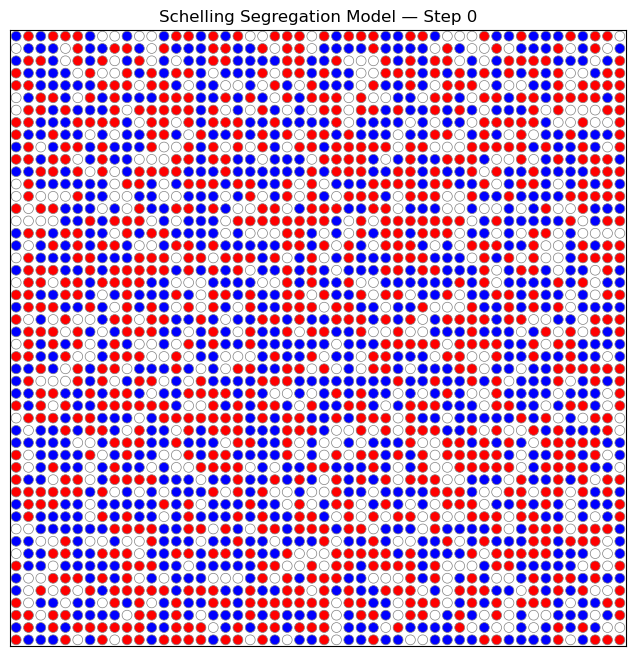

Stable at step 13


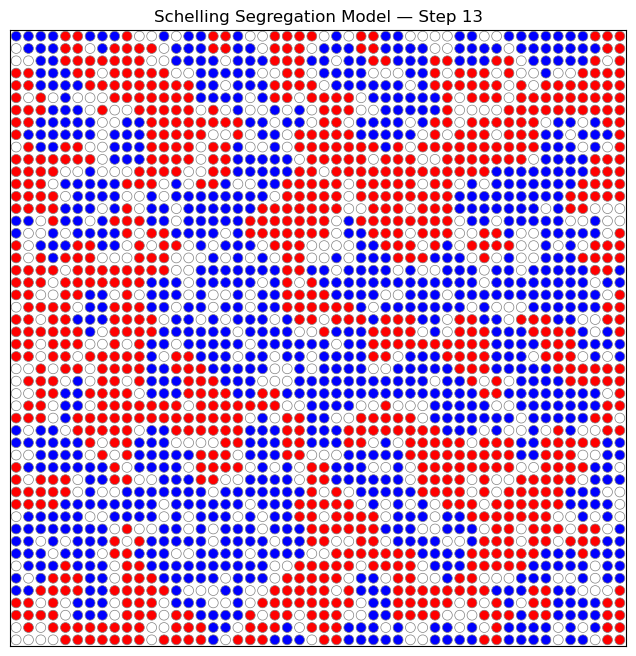

In [2]:
model_fixed_moore = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=1,
        threshold_distribution=(0.4, 0.4),
        max_steps=50,
        seed=42
    )
model_fixed_moore.plot()
model_fixed_moore.run()
model_fixed_moore.plot()

### Radius-2 Neighbourhood

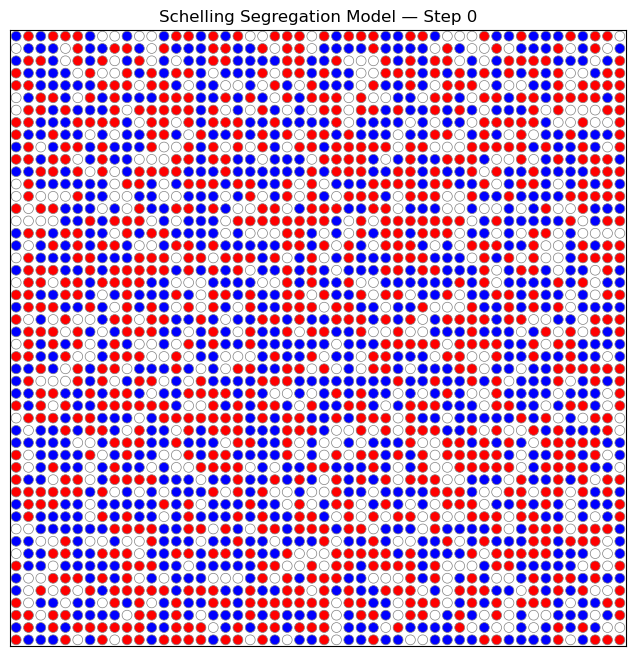

Stable at step 16


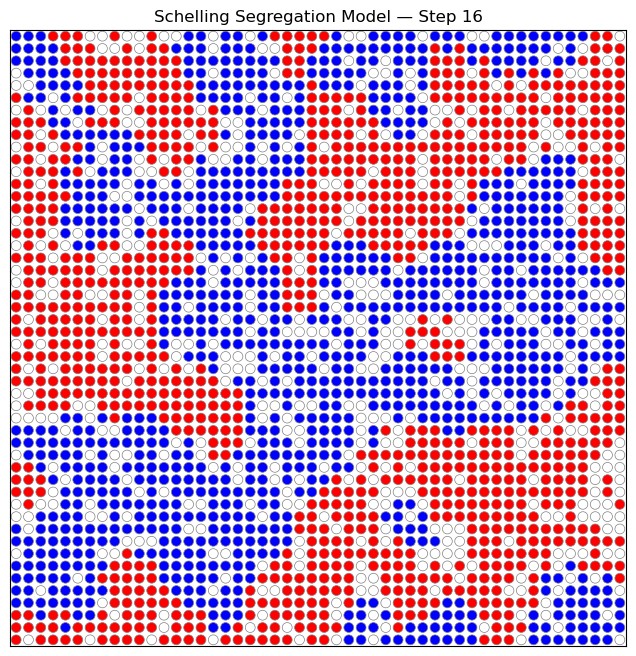

In [3]:
model_fixed_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.4, 0.4),
        max_steps=50,
        seed=42
    )
model_fixed_r2.plot()
model_fixed_r2.run()
model_fixed_r2.plot()

### Radius-3 Neighbourhood

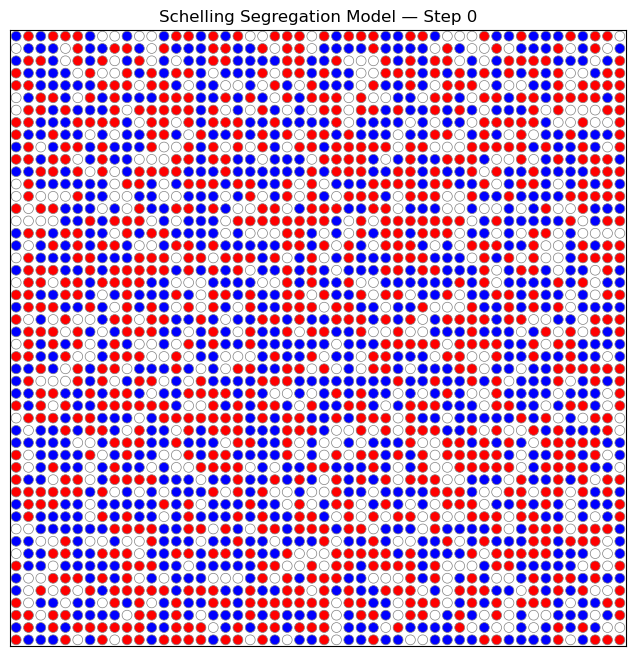

Stable at step 20


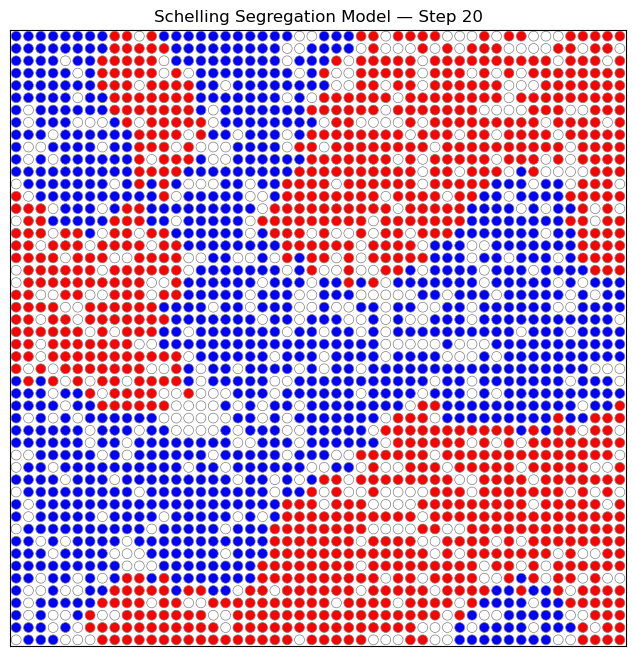

In [4]:
model_fixed_r3 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=3,
        threshold_distribution=(0.4, 0.4),
        max_steps=50,
        seed=42
    )
model_fixed_r3.plot()
model_fixed_r3.run()
model_fixed_r3.plot()

## Heterogeneous Tolerance Thresholds

We explore the effect of heterogeneous tolerance thresholds by setting the tolerance, $T$, to be uniformly distributed, for a fixed radius, $R=2$. 

### $T = 0.4$

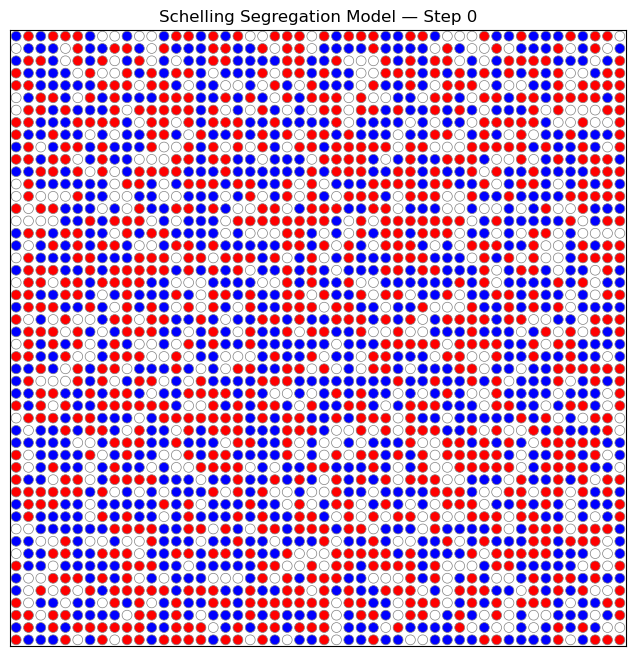

Stable at step 16


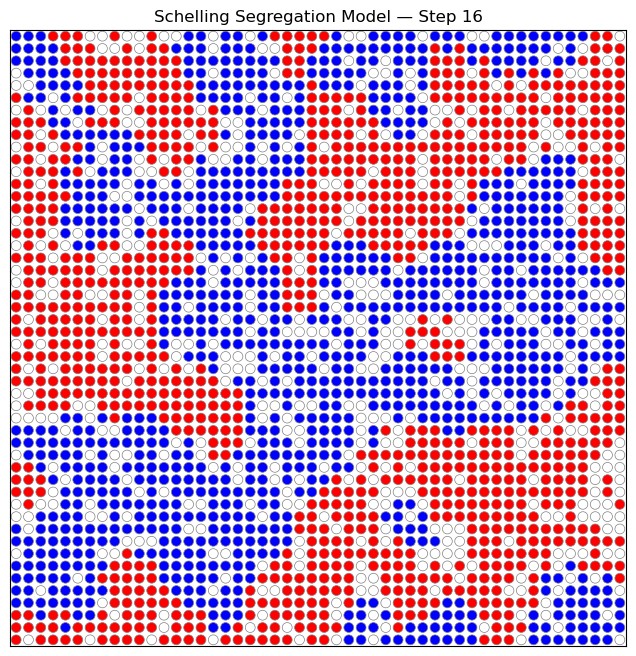

In [5]:
model_fixed_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.4, 0.4),
        max_steps=50,
        seed=42
    )
model_fixed_r2.plot()
model_fixed_r2.run()
model_fixed_r2.plot()

### $T \sim U(0.2,0.6)$

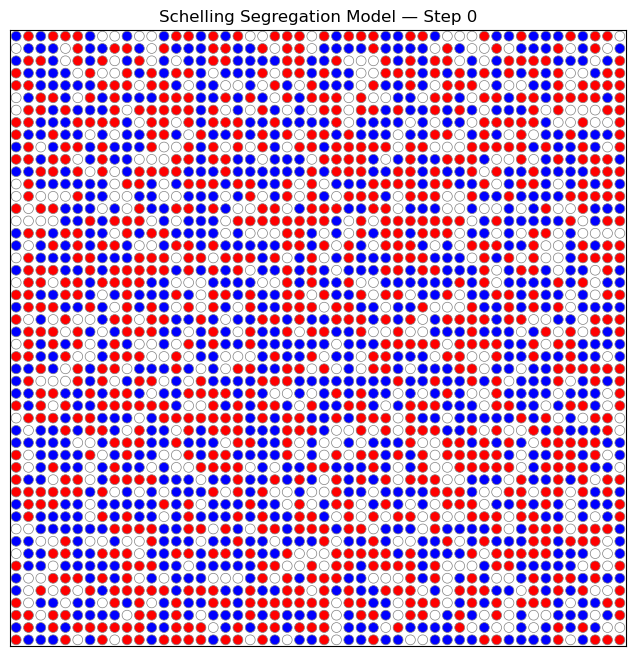

Stable at step 16


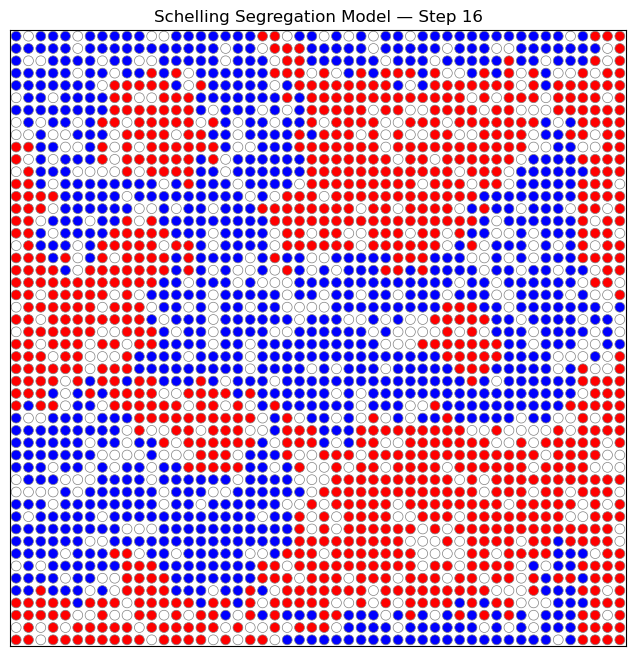

In [6]:
model_var_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.2, 0.6),
        max_steps=50,
        seed=42
    )
model_var_r2.plot()
model_var_r2.run()
model_var_r2.plot()

### $T \sim U(0.0,0.8)$

Stable at step 54


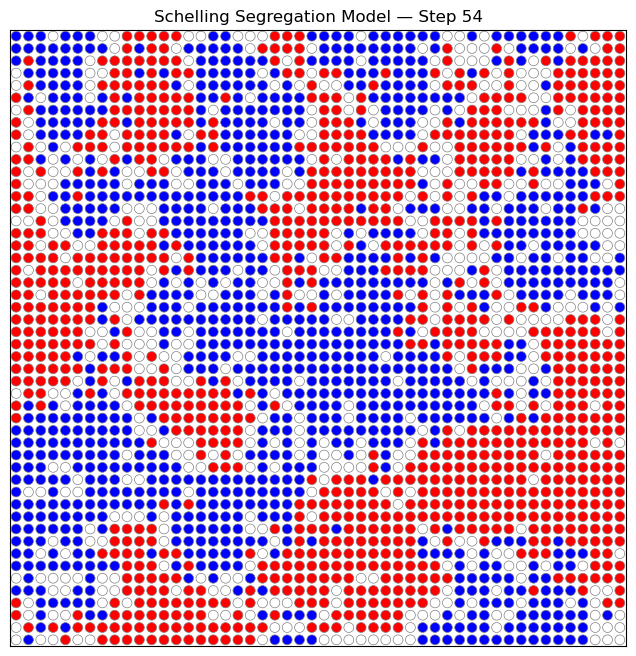

In [7]:
model_varr_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.0, 0.8),
        max_steps=100,
        seed=42
    )
model_varr_r2.run()
model_varr_r2.plot()

### $T = 0.6$

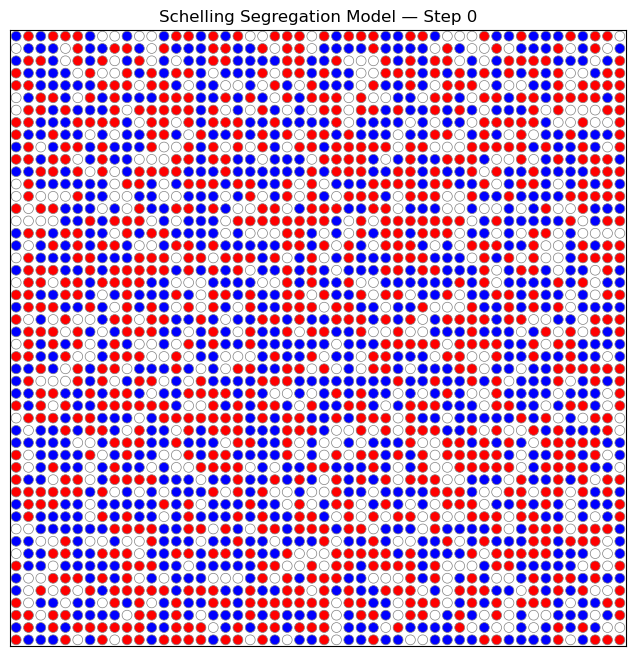

Stable at step 33


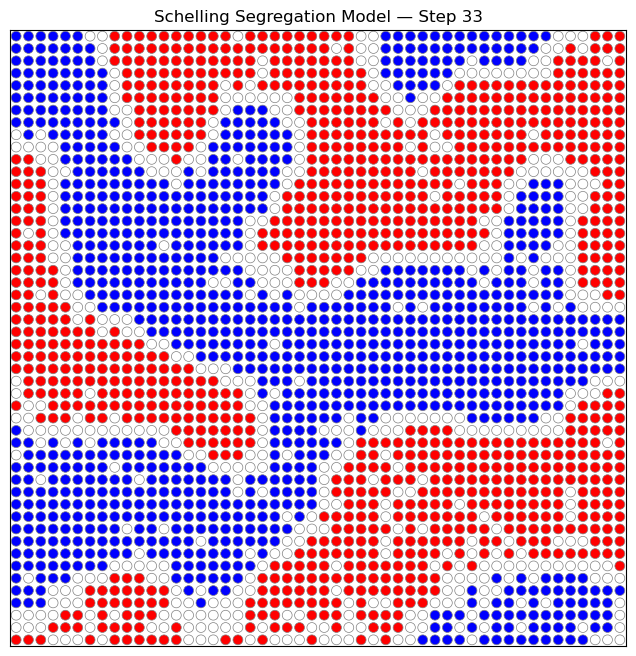

In [8]:
model_fixed_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.6, 0.6),
        max_steps=50,
        seed=42
    )
model_fixed_r2.plot()
model_fixed_r2.run()
model_fixed_r2.plot()

### $T \sim U(0.4,0.8)$

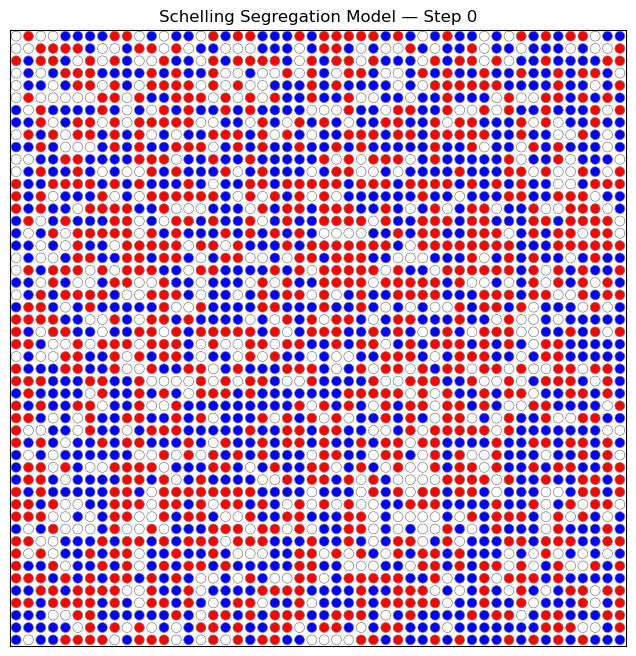

Stable at step 43


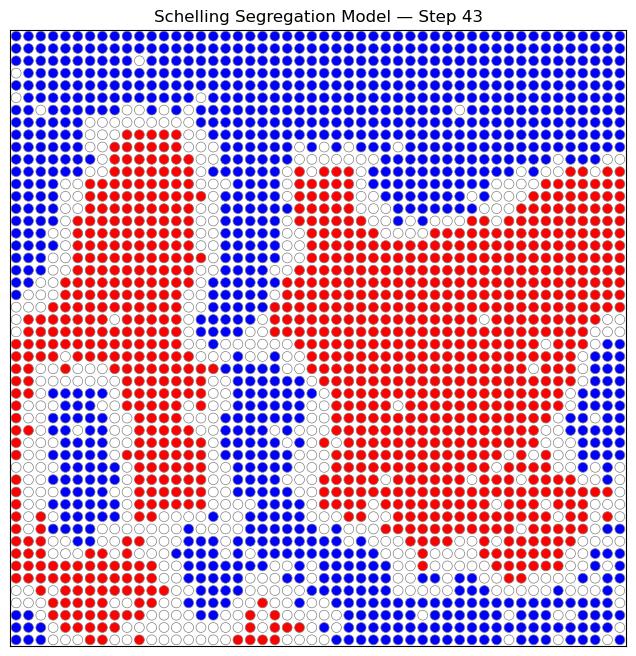

In [9]:
model_var_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.4, 0.8),
        max_steps=100,
        seed=40
    )
model_var_r2.plot()
model_var_r2.run()
model_var_r2.plot()

### $T \sim U(0.3,0.9)$

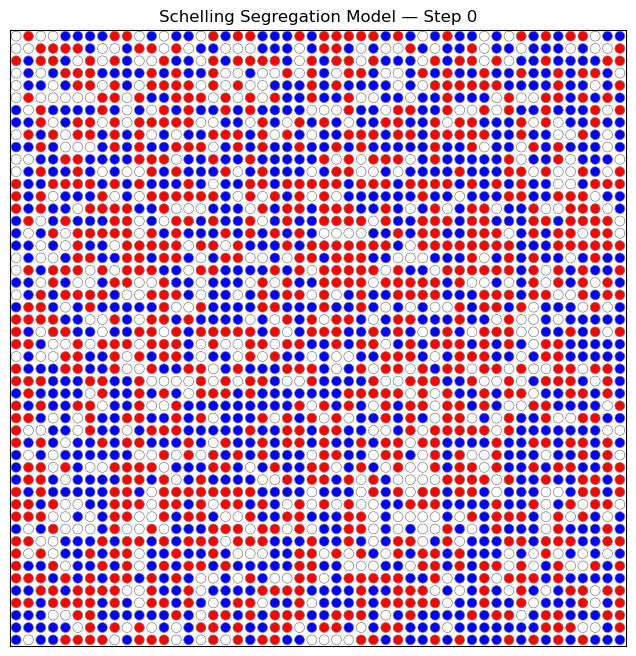

Stable at step 478


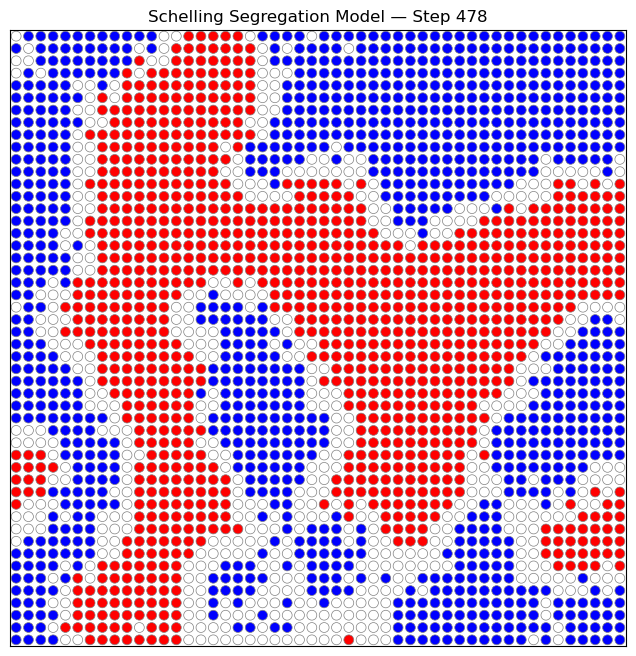

In [10]:
model_varr_r2 = SchellingModel(
        size=50,
        empty_ratio=0.2,
        group_ratio=0.5,
        neighborhood_radius=2,
        threshold_distribution=(0.3, 0.9),
        max_steps=500,
        seed=40
    )
model_varr_r2.plot()
model_varr_r2.run()
model_varr_r2.plot()